In [2]:
import pandas as pd
import scanpy as sc
import numpy as np
import torch
import sys
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import sys
sys.path.insert(0, '/home/ph3641/WDM/WDM/')
import clustering
import util_LR
import FRLC_LRDist

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'On device: {device}')
dtype = torch.float64

daniocell_dir = '/scratch/gpfs/ph3641/zebrafish/daniocell.h5ad'
adata_daniocell = sc.read_h5ad(daniocell_dir)

stages = np.unique(adata_daniocell.obs['hpf'].values)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'On device: {device}')
dtype = torch.float64

filehandle_zf = '/scratch/gpfs/ph3641/zebrafish/'

zf_list = ['zf3', 'zf5', 'zf10', 'zf12', 'zf18', 'zf24']
zf_names = zf_list
filehandles_zf = [filehandle_zf + 'pair' + str(k) + '/' for k in range(len(zf_list))]
N = len(filehandles_zf)

spatial_list = []
exclude_rows = [1099, None, None, 325, None, None]

for i in range(len(zf_list)):
    file_spatial = filehandles_zf[i] + zf_names[i] +'_spatial.npy'
    if i == len(zf_list) - 1:
        file_spatial = filehandles_zf[i-1] + zf_names[i] +'_spatial.npy'
    spatial = np.load(file_spatial)
    nidx = exclude_rows[i]
    if nidx is not None:
        spatial = np.concatenate((spatial[:nidx,:], spatial[nidx+1:,:]))
    spatial_list.append(spatial)


def load_mats(save_dir, s1_name, s2_name, device, z=None, c=100, nidx_1=None, nidx_2=None):
    # Load costs
    A = np.load(save_dir + 'SA.npy')
    B = np.load(save_dir + 'SB.npy')
    
    ys = torch.from_numpy(np.load(save_dir + s1_name + f'_feature.npy')).type(torch.DoubleTensor).to(device)
    ys2 = torch.from_numpy(np.load(save_dir + s2_name + f'_feature.npy')).type(torch.DoubleTensor).to(device)
    
    if nidx_1 is not None:
        ys = torch.cat((ys[:nidx_1,:], ys[nidx_1+1:,:]))
    if nidx_2 is not None:
        ys2 = torch.cat((ys2[:nidx_2,:], ys2[nidx_2+1:,:]))
    
    C = torch.cdist(ys, ys2).type(torch.DoubleTensor).to(device)
    
    norm1 = c
    norm2 = A.max()*c
    norm3 = B.max()*c
    
    if z is None:
        # No low-rank factorization applied to the distance matrix
        A = torch.from_numpy(A).to(device)
        B = torch.from_numpy(B).to(device)
        C_factors = (C/ (norm1), torch.eye(C.shape[1]).type(torch.DoubleTensor).to(device))
        A_factors = (A/ (norm2), torch.eye(A.shape[1]).type(torch.DoubleTensor).to(device))
        B_factors = (B/ (norm3), torch.eye(B.shape[1]).type(torch.DoubleTensor).to(device))

    else:
        # Distance matrix factored using SVD
        u, s, v = torch.svd(C)
        print('C done')
        V_C,U_C = torch.mm(u[:,:z], torch.diag(s[:z])), v[:,:z].mT
        u, s, v = torch.svd(torch.from_numpy(A).to(device))
        print('A done')
        V1_A,V1_B = torch.mm(u[:,:z], torch.diag(s[:z])), v[:,:z].mT
        u, s, v = torch.svd(torch.from_numpy(B).to(device))
        print('B done')
        V2_A,V2_B = torch.mm(u[:,:z], torch.diag(s[:z])), v[:,:z].mT
        C_factors, A_factors, B_factors = ((V_C.type(torch.DoubleTensor).to(device)/norm1, U_C.type(torch.DoubleTensor).to(device)/norm1), \
                                       (V1_A.type(torch.DoubleTensor).to(device)/norm2, V1_B.type(torch.DoubleTensor).to(device)/norm2), \
                                       (V2_A.type(torch.DoubleTensor).to(device)/norm3, V2_B.type(torch.DoubleTensor).to(device)/norm3))
    
    return C_factors, A_factors, B_factors


On device: cuda
On device: cuda


In [3]:

N = len(filehandles_zf)
Qs = [None]*(N-1)
Rs = [None]*(N-1)

key = 'bin_annotation'

labels = []

for i in range(N-2, -1, -1):

    s1_name = zf_names[i]
    s2_name = zf_names[i+1]
    
    print(f'Slice pair {i}, aligning {s1_name} to {s2_name}')
    
    adata_pair = sc.read_h5ad(filehandle_zf + f'pair{i}/' + s1_name + '_' + s2_name + '.h5ad')
    
    adata1 = adata_pair[adata_pair.obs['timepoint'] == 1]
    sc.pp.normalize_total(adata1)
    sc.pp.log1p(adata1)
    
    adata2 = adata_pair[adata_pair.obs['timepoint'] == 2]
    sc.pp.normalize_total(adata2)
    sc.pp.log1p(adata2)
    
    encoder1 = OneHotEncoder(sparse_output=False)
    ys_onehot1 = encoder1.fit_transform(adata1.obs[key].values.reshape(-1, 1))
    _Q = ys_onehot1 / np.sum(ys_onehot1)
    
    encoder2 = OneHotEncoder(sparse_output=False)
    ys_onehot2 = encoder2.fit_transform(adata2.obs[key].values.reshape(-1, 1))
    _R = ys_onehot2 / np.sum(ys_onehot2)

    labels.append(list(encoder2.categories_[0]))
    
    if i == 0:
        labels.append(list(encoder1.categories_[0]))
    
    _Q, _R = torch.from_numpy(_Q).to(device).float(), torch.from_numpy(_R).to(device).float()

    # Filter rows
    nidx_1, nidx_2 = exclude_rows[i], exclude_rows[i+1]
    if nidx_1 is not None:
        _Q = torch.cat((_Q[:nidx_1,:], _Q[nidx_1+1:,:]))
    if nidx_2 is not None:
        _R = torch.cat((_R[:nidx_2,:], _R[nidx_2+1:,:]))
        
    Qs[i], Rs[i] = _Q, _R

Slice pair 4, aligning zf18 to zf24


/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Slice pair 3, aligning zf12 to zf18


/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Slice pair 2, aligning zf10 to zf12


/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Slice pair 1, aligning zf5 to zf10


/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Slice pair 0, aligning zf3 to zf5


/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [4]:


spatial_list2 = []
for i in range(len(zf_list)):
    file_spatial = filehandles_zf[i] + zf_names[i] +'_spatial.npy'
    if i == len(zf_list) - 1:
        file_spatial = filehandles_zf[i-1] + zf_names[i] +'_spatial.npy'
    spatial = np.load(file_spatial)
    spatial_list2.append(spatial)

In [5]:
import WassersteinDiffMap
import importlib

importlib.reload(WassersteinDiffMap)

Qs.append(Rs[-1])
rank_list = [(3,7),(7,7),(7,11),(11,14),(14,19)]
exclude_rows = [1099, None, None, 325, None, None]

C_factors_sequence = []
A_factors_sequence = []

for i in range(len(rank_list)):
    
    s1_name = zf_names[i]
    s2_name = zf_names[i+1]
    
    print(f'Loading slices {s1_name} to {s2_name}')
    
    r1, r2 = rank_list[i]
    nidx_1, nidx_2 = exclude_rows[i], exclude_rows[i+1]
    
    filehandle_pair = filehandle_zf + 'pair' + str(i) + '/'
    save_dir = filehandle_pair
    C_factors12, A_factors11, A_factors22 = load_mats(save_dir, s1_name, s2_name, \
                                                    device, z=50, c=100, nidx_1=nidx_1, nidx_2=nidx_2)
    C_factors_sequence.append(C_factors12)
    if i == 0:
        A_factors_sequence.append(A_factors11)
        A_factors_sequence.append(A_factors22)
    else:
        A_factors_sequence.append(A_factors22)


c = max([torch.max(C[0] @ C[1]) for C in C_factors_sequence])
c = max(c, 1/c)
for i in range(len(C_factors_sequence)):
    C = C_factors_sequence[i]
    C_factors_sequence[i] = (C[0]/c, C[1]/c)


Loading slices zf3 to zf5
C done
A done
B done
Loading slices zf5 to zf10
C done
A done
B done
Loading slices zf10 to zf12
C done
A done
B done
Loading slices zf12 to zf18
C done
A done
B done
Loading slices zf18 to zf24
C done
A done
B done


In [6]:
Ss = spatial_list

Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein cost: 3.941310372827634e-09, GW-cost: 5.926528206929629e-09, Total cost: 3.959177333334552e-09
Final Wasserstein cost: 3.865711417147769e-09, GW-cost: 5.979942550474309e-09, Total cost: 3.884739497347708e-09


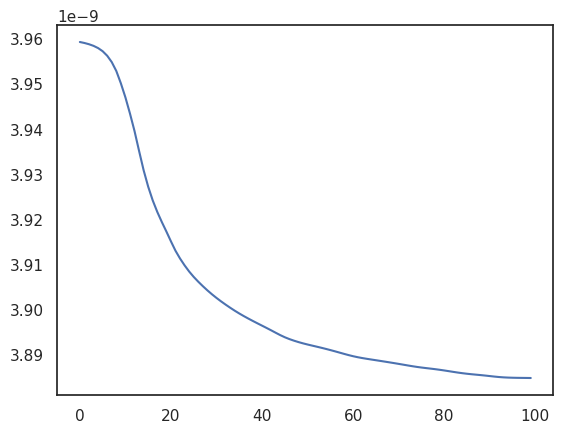

Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein cost: 4.034133959740355e-09, GW-cost: 7.701939377565895e-09, Total cost: 4.067144208500784e-09
Final Wasserstein cost: 3.970076241521652e-09, GW-cost: 7.62967809223841e-09, Total cost: 4.003012658178103e-09


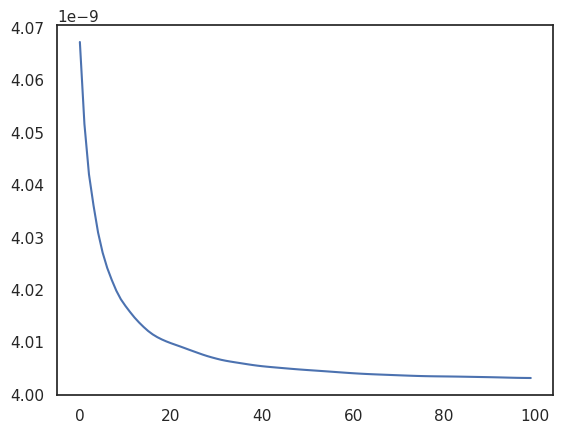

Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein cost: 2.85648280654193e-09, GW-cost: 8.156398223004612e-09, Total cost: 2.9041820452900944e-09
Final Wasserstein cost: 2.717962157196642e-09, GW-cost: 8.121488247409043e-09, Total cost: 2.7665938920085536e-09


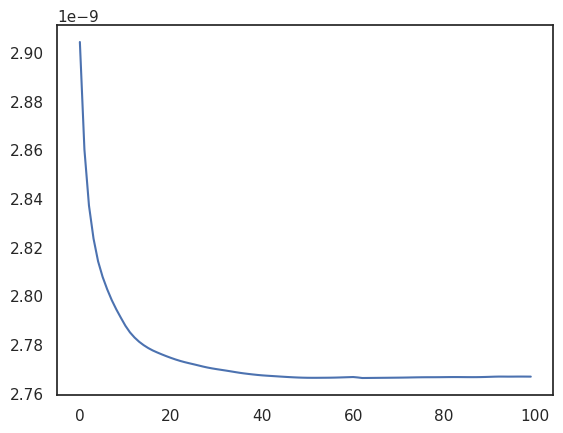

Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein cost: 3.2023780490373595e-09, GW-cost: 7.170490791191292e-09, Total cost: 3.2380910637167447e-09
Final Wasserstein cost: 3.030870420505663e-09, GW-cost: 7.137043954250934e-09, Total cost: 3.0678259823093704e-09


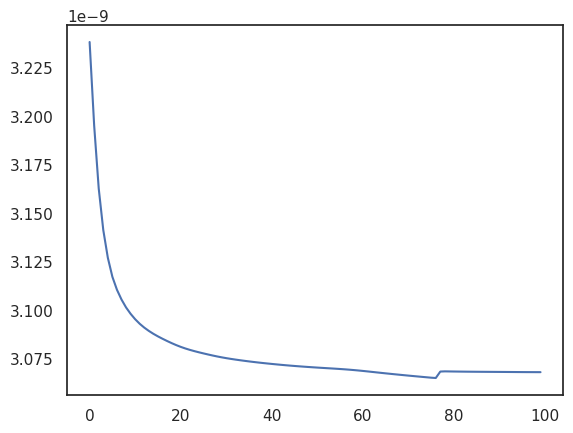

Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein cost: 3.447504034362918e-09, GW-cost: 5.348723637221157e-09, Total cost: 3.464615010788642e-09
Final Wasserstein cost: 2.857252067584511e-09, GW-cost: 4.08147762658602e-09, Total cost: 2.8682700976155246e-09


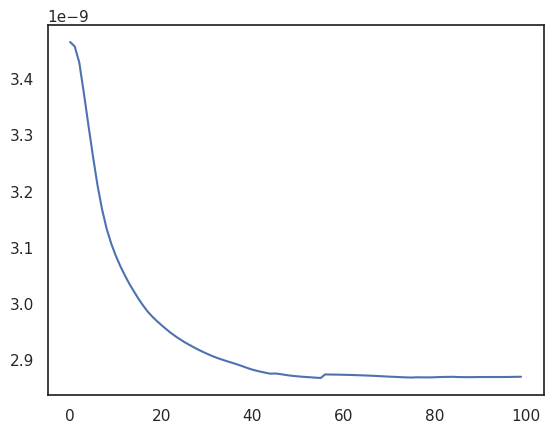

torch.Size([3048, 14])
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein cost: 3.2218361547866094e-09, GW-cost: 7.2117448297909925e-09, Total cost: 3.257745332861649e-09
Final Wasserstein cost: 3.0038123046303392e-09, GW-cost: 6.370010151101413e-09, Total cost: 3.034108085248579e-09


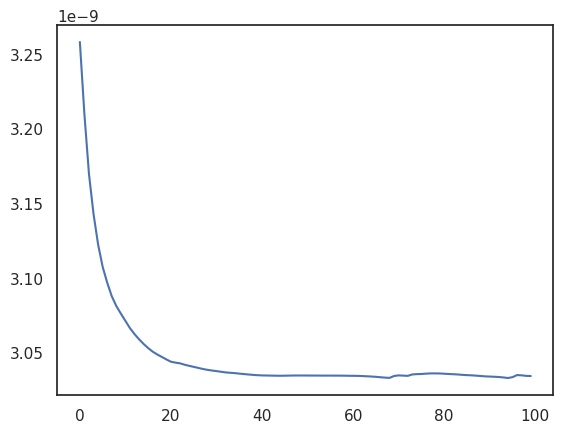

torch.Size([2080, 11])
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein cost: 2.794673551629678e-09, GW-cost: 8.011730297440906e-09, Total cost: 2.841627062341979e-09
Final Wasserstein cost: 2.6259040681578125e-09, GW-cost: 7.227477115540928e-09, Total cost: 2.6673182255842605e-09


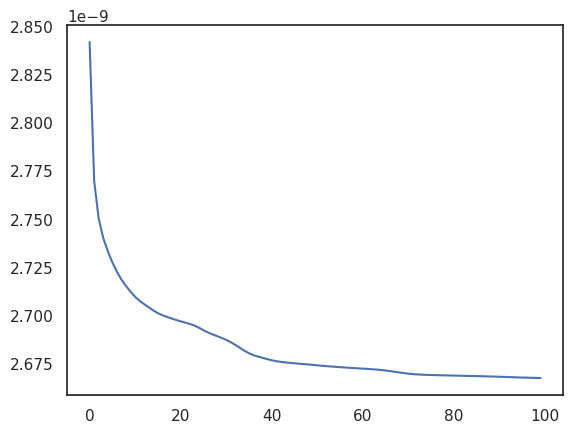

torch.Size([1036, 7])
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein cost: 4.026163714539182e-09, GW-cost: 7.777567469437236e-09, Total cost: 4.0599263483332635e-09
Final Wasserstein cost: 3.916295875812759e-09, GW-cost: 7.4415223691601836e-09, Total cost: 3.948022914252886e-09


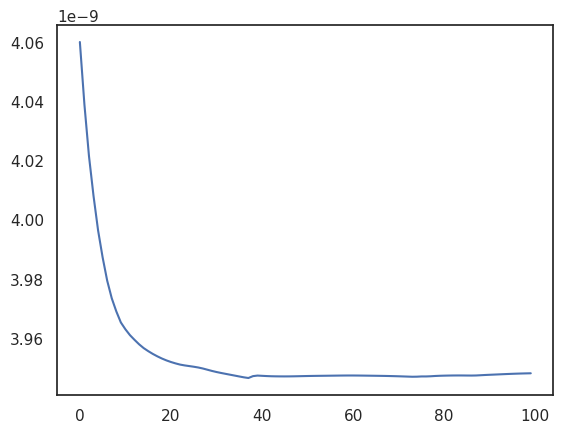

Ranks: r1 3, r2 7, r3 7
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein-sum cost: 7.949535671996423e-09
Final Wasserstein-sum cost: 7.805115017135092e-09


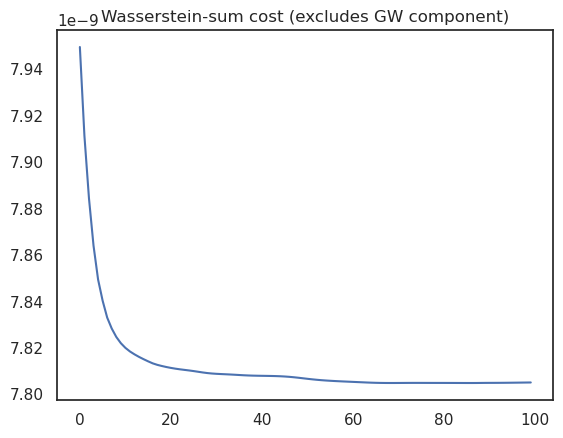

Ranks: r1 7, r2 7, r3 11
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein-sum cost: 6.9313710636698554e-09
Final Wasserstein-sum cost: 6.626116758729523e-09


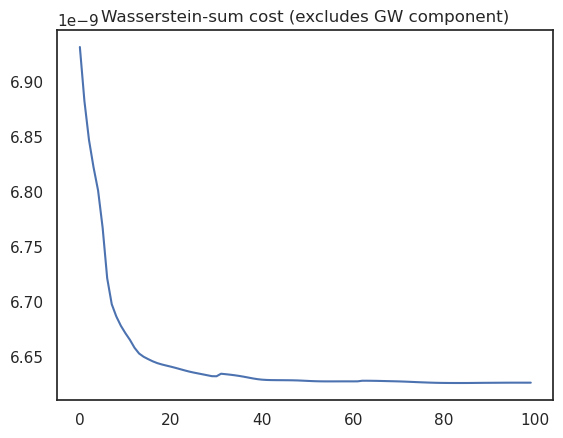

Ranks: r1 7, r2 11, r3 14
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein-sum cost: 6.1230233555344476e-09
Final Wasserstein-sum cost: 5.7842745203487685e-09


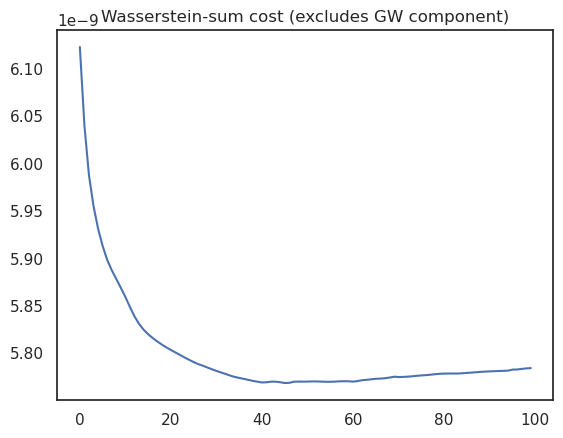

Ranks: r1 11, r2 14, r3 19
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein-sum cost: 6.530913446391043e-09
Final Wasserstein-sum cost: 5.945682217659188e-09


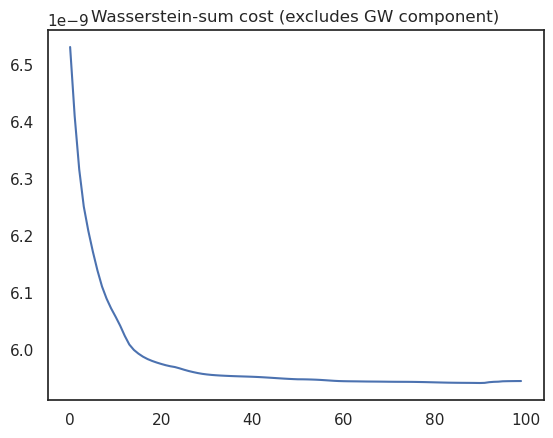

Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein cost: 3.928914720175567e-09, GW-cost: 5.910607830048533e-09, Total cost: 3.946749958164424e-09
Final Wasserstein cost: 3.883971264497657e-09, GW-cost: 5.916644795965524e-09, Total cost: 3.9022653262808674e-09


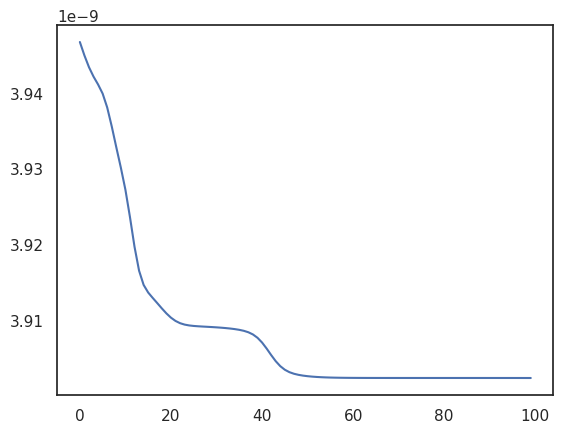

Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein cost: 4.0828893837334324e-09, GW-cost: 7.62153316460801e-09, Total cost: 4.1147371777613036e-09
Final Wasserstein cost: 3.928413442448373e-09, GW-cost: 7.465995959248227e-09, Total cost: 3.960251685099572e-09


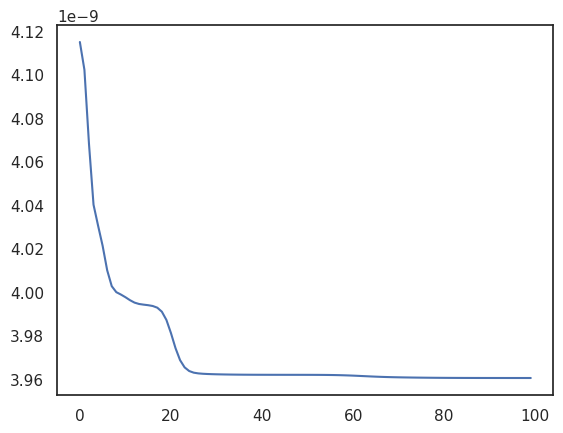

Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein cost: 2.7252290977101538e-09, GW-cost: 7.842522858680146e-09, Total cost: 2.7712847415588835e-09
Final Wasserstein cost: 2.6414971359134677e-09, GW-cost: 7.650870308495387e-09, Total cost: 2.686581494466705e-09


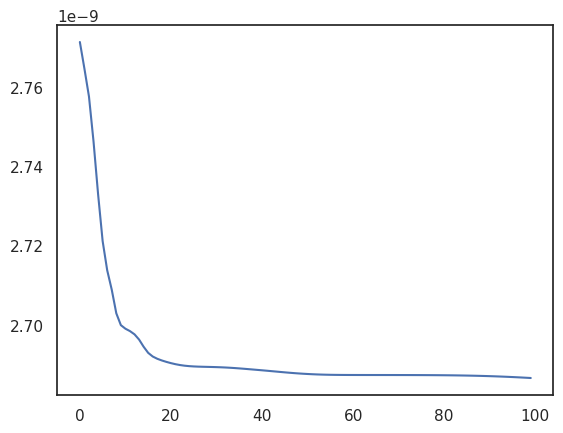

Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein cost: 3.160768330817183e-09, GW-cost: 6.948033210409768e-09, Total cost: 3.1948537147335164e-09
Final Wasserstein cost: 3.028870857185794e-09, GW-cost: 6.600808270297202e-09, Total cost: 3.0610182939037965e-09


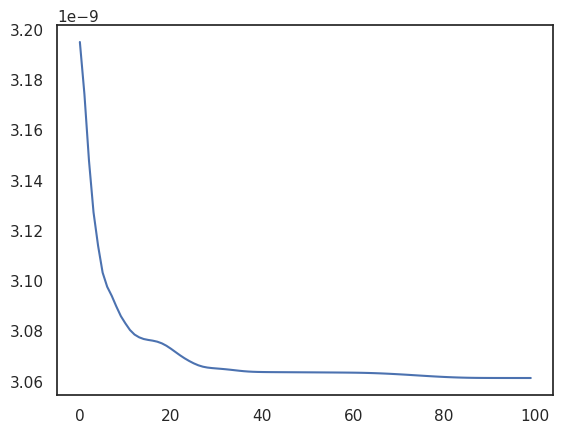

Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein cost: 3.174971766022344e-09, GW-cost: 4.961869245190147e-09, Total cost: 3.191053843334854e-09
Final Wasserstein cost: 2.878819551982606e-09, GW-cost: 4.0024968959407795e-09, Total cost: 2.8889326480782294e-09


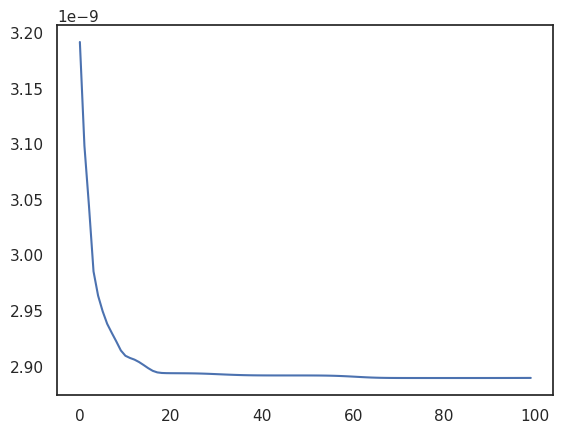

total number of tab colors that can be displayed: 60
total number of unique values: 61


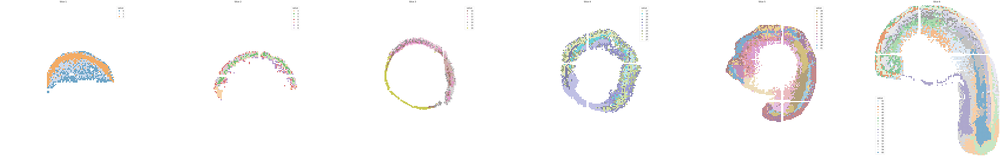

total number of tab colors that can be displayed: 60
total number of unique values: 61


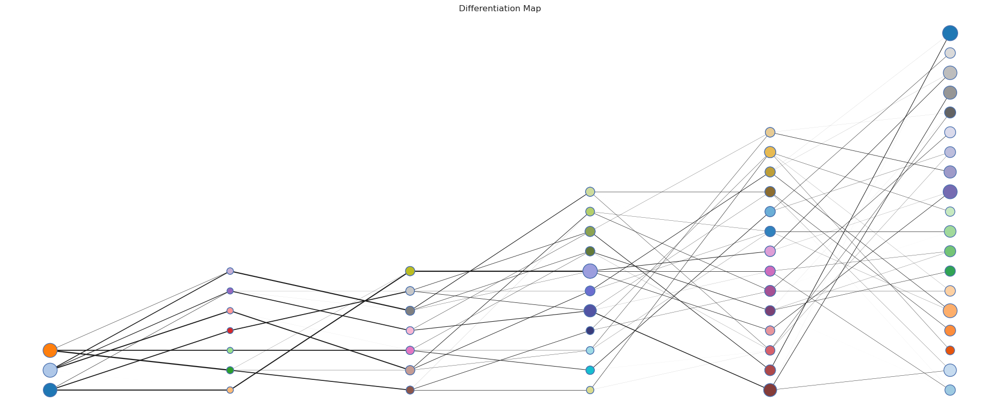

In [18]:
import clustering
importlib.reload(WassersteinDiffMap)

gamma=30
tau_out=1
tau_in=1e-7
alpha = 0.009
beta = 0.0

WDM = WassersteinDiffMap.WassersteinDifferentiationMapping(rank_list, tau_in = tau_in, tau_out=tau_out, \
                      gamma=gamma, max_iter=100, min_iter=100, device=device, dtype=torch.float64, \
                     printCost=True, returnFull=False, alpha=alpha, beta=beta, \
                      initialization='Full', init_args = None)

WDM.gamma_smoothing(C_factors_sequence, A_factors_sequence)

Qs_ann = [Q.cpu().numpy() for Q in WDM.Q_gammas]
Ts_ann = [T.cpu().numpy() for T in WDM.T_gammas]
node_labels1 = [None for Q in WDM.Q_gammas]

clustering.plot_clusters_from_QT(Ss, Qs_ann, Ts_ann, node_labels1)
clustering.diffmap_from_QT(Qs_ann, Ts_ann, cell_type_labels=node_labels1)

In [28]:
for i,Q in enumerate(WDM.Q_gammas):
    np.save(f'data2/Q{i}.npy', Q.cpu().numpy())

for i,T in enumerate(WDM.T_gammas):
    np.save(f'data2/T{i}{i+1}.npy', T.cpu().numpy())

total number of tab colors that can be displayed: 60
total number of unique values: 3


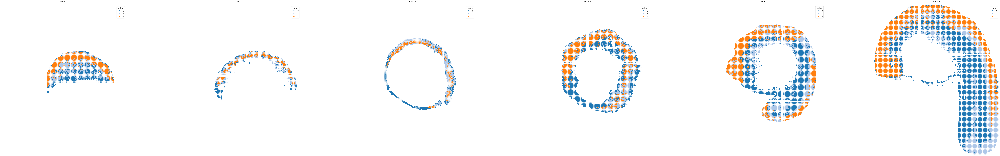

total number of tab colors that can be displayed: 60
total number of unique values: 19


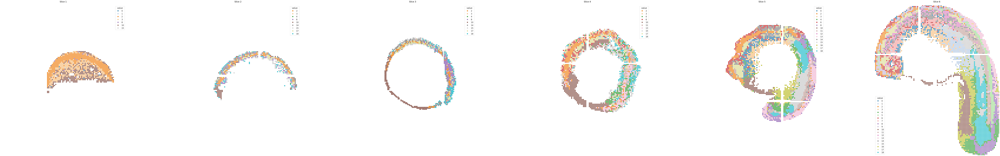

In [25]:
clustering.plot_clusters_from_QT(Ss, Qs_ann, Ts_ann, node_labels1, clustering_type='reference', reference_index=0)
clustering.plot_clusters_from_QT(Ss, Qs_ann, Ts_ann, node_labels1, clustering_type='reference', reference_index=5)